In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json # for reading the tr
import glob # for creating lists of files
import nibabel as nib # for reading in your brain data
from nilearn import plotting # for vizualizing brain data
from nilearn import surface
from nilearn.plotting import plot_design_matrix, plot_contrast_matrix
from nilearn.glm.first_level import FirstLevelModel
from nilearn import datasets
from nilearn import signal

# ROI
import nibabel as nib
import numpy as np
from nilearn import datasets, image
import os
from nilearn.datasets import fetch_atlas_surf_destrieux, fetch_surf_fsaverage
from nilearn.plotting import plot_surf_roi

# Decoding 
from nilearn.maskers import NiftiMasker
from nilearn.decoding import Decoder

In [5]:
# set some variables relevant to your data
sub = 'sub-6'
ses = 'ses-1'
task = 'bold'

## Native T1w (Volumetric native space)

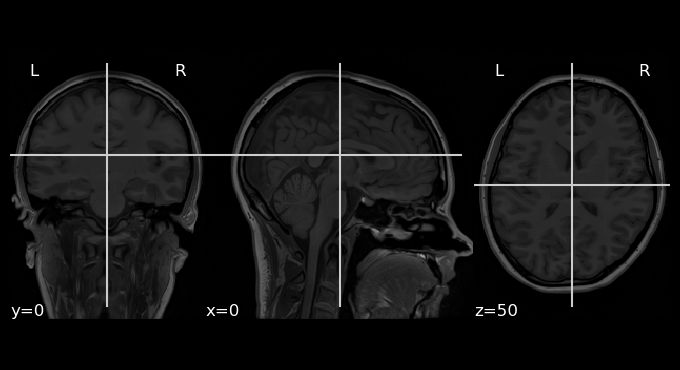

In [6]:
native_t1_path = f'{sub}/{ses}/anat/{sub}_{ses}_desc-preproc_T1w.nii.gz' 
native_t1 = nib.load(native_t1_path)

plotting.plot_anat(native_t1, cut_coords=(0,0,50))

## Average T1w  (Volumetric average space)

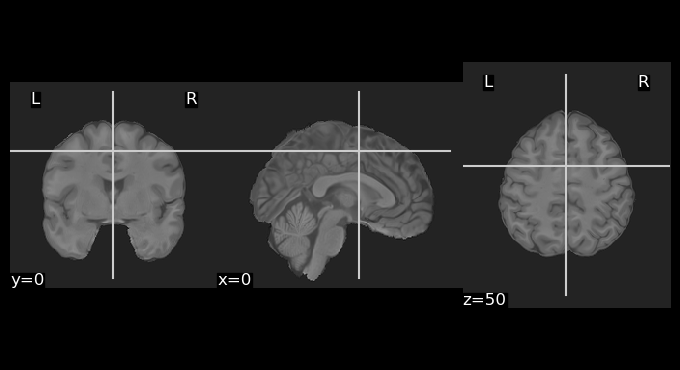

In [7]:
mni_t1_path = f'{sub}/{ses}/anat/{sub}_{ses}_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz' 
mni_t1 = nib.load(mni_t1_path)

plotting.plot_anat(mni_t1, cut_coords=(0,0,50))

## Plot of Interactive MNI Brain

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



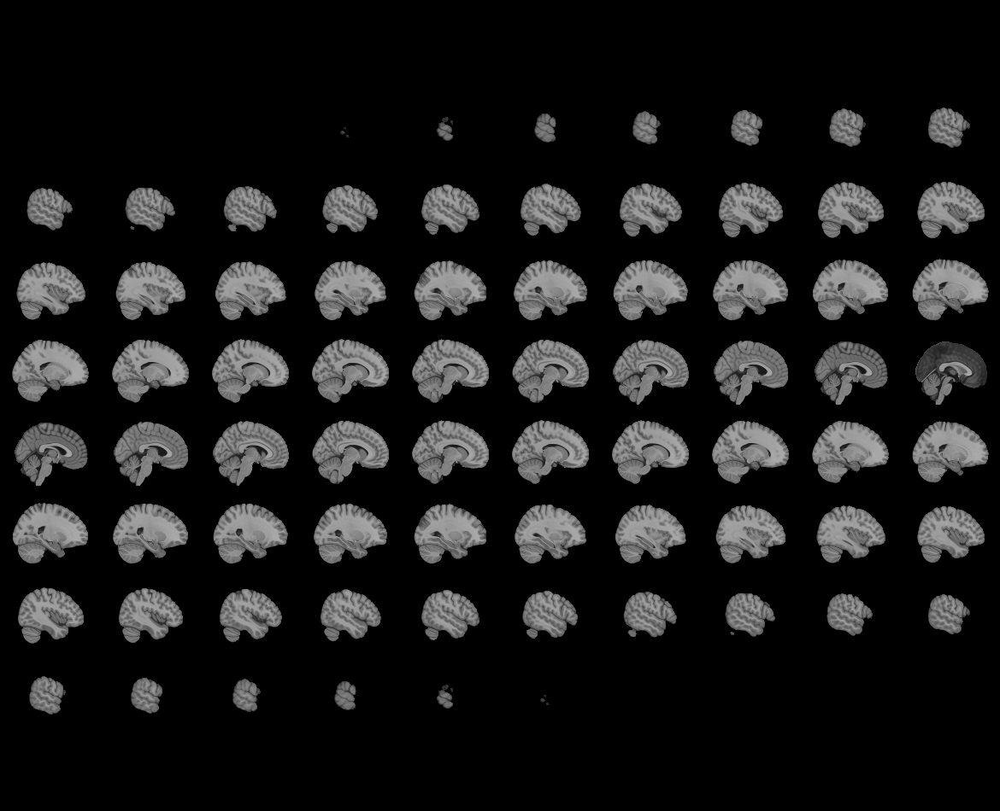
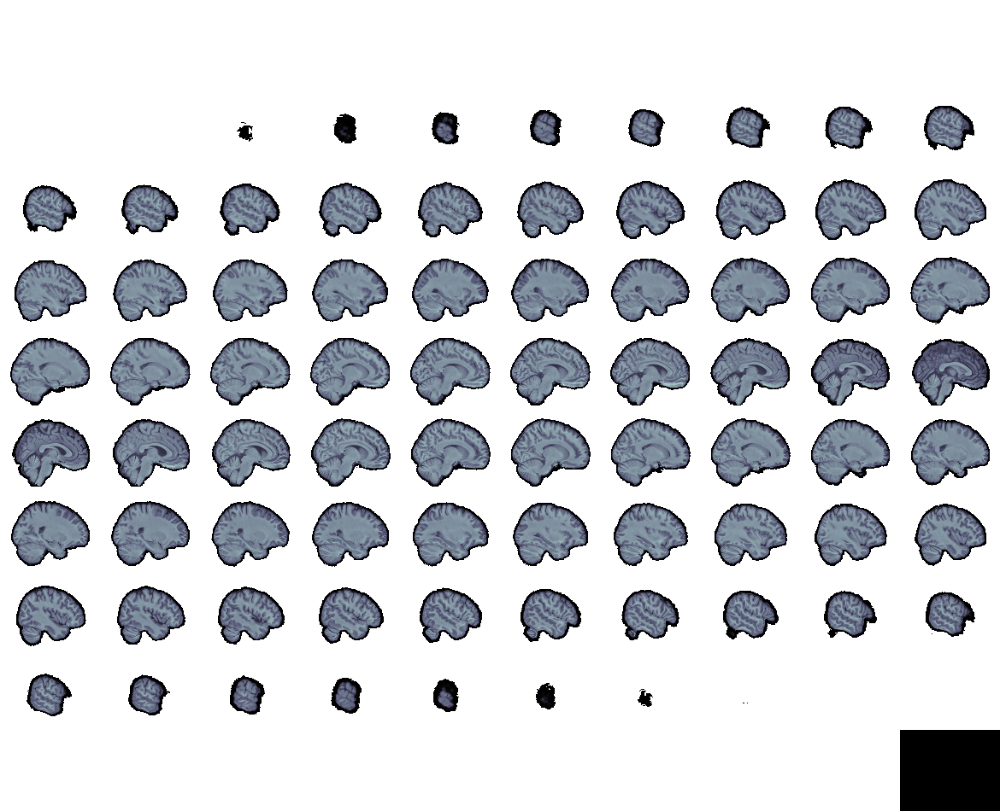

In [8]:
# plot an interactive MNI brain
plotting.view_img(mni_t1,cmap='brown_blue')

## Native Surface (free surfer/fs) - volumteric data

In [9]:
# Load in the fsnative anatomical images
#fsnative_lh = surface.load_surf_mesh(f'freesurfer/{sub}/surf/lh.pial')
#fsnative_rh = surface.load_surf_mesh(f'freesurfer/{sub}/surf/rh.pial')

# # Alternative options - these will have different dimensions than the freesurfer folder
fsnative_lh = surface.load_surf_mesh(f'{sub}/{ses}/anat/{sub}_{ses}_hemi-L_pial.surf.gii')
fsnative_rh = surface.load_surf_mesh(f'{sub}/{ses}/anat/{sub}_{ses}_hemi-R_pial.surf.gii')

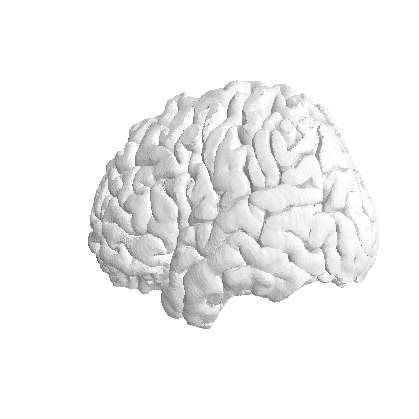

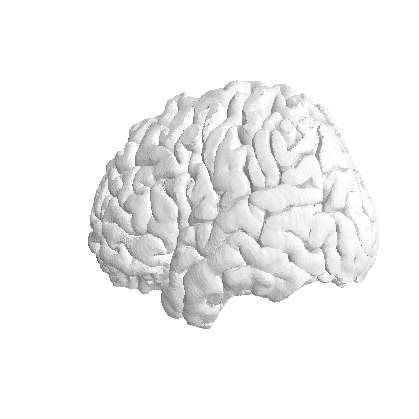

In [10]:
plotting.plot_surf(fsnative_lh,hemi='left')

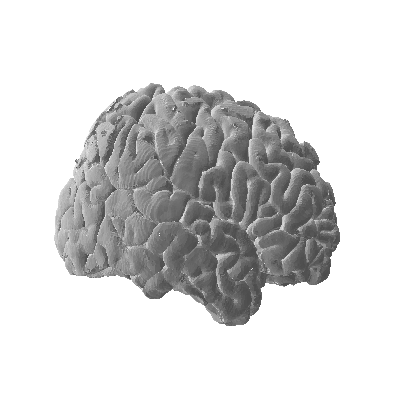

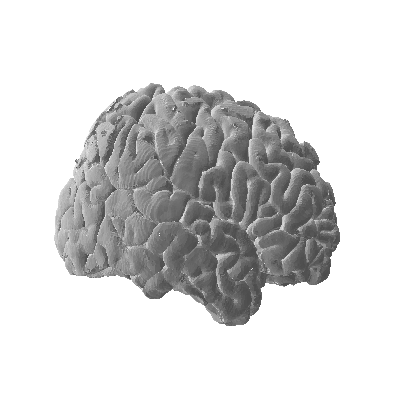

In [10]:
plotting.plot_surf(fsnative_rh,hemi='right')

In [11]:
# Load in the fsaverage anatomical images - Isuggest using this
fsaverage = datasets.fetch_surf_fsaverage()

fsaverage_lh = surface.load_surf_mesh(fsaverage['pial_left'])
fsaverage_rh = surface.load_surf_mesh(fsaverage['pial_right'])

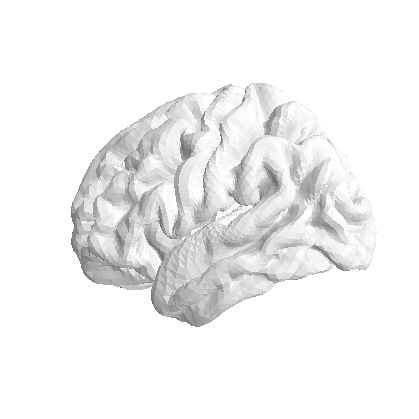

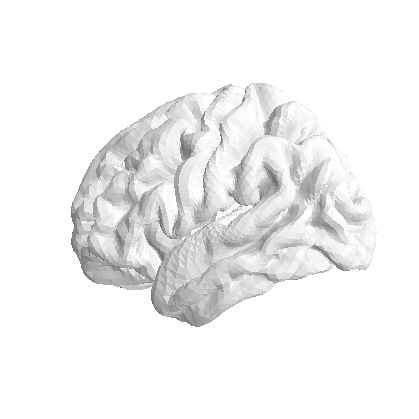

In [12]:
plotting.plot_surf(fsaverage_lh,hemi='left')

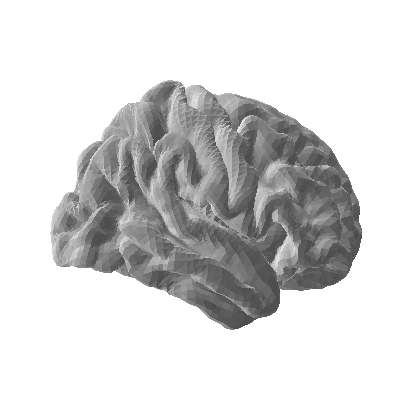

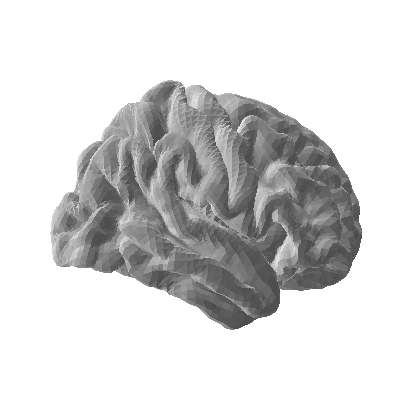

In [13]:
plotting.plot_surf(fsaverage_rh,hemi='right')

In [21]:
plotting.view_surf(surf_mesh=fsaverage_lh,colorbar=False)

# Analysis

In [14]:
#load in
image_paths = glob.glob(f'{sub}/{ses}/func/{sub}_{ses}_task-{task}_run-*_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz')
json_paths = glob.glob(f'{sub}/{ses}/func/{sub}_{ses}_task-{task}_run-*_space-MNI152NLin2009cAsym_desc-preproc_bold.json')
tracy_event = glob.glob(f'tracyli_event_file.csv')

image_paths.sort()
json_paths.sort()
tracy_event.sort()

# read in and create a list of all the functional data
images = []
for img in image_paths:
    func_img = nib.load(img)
    images.append(func_img)

In [15]:
#read in the csv
events = pd.read_csv('tracyli_event_file.csv')
# grab scan start time from start of intial 10 second blank trial
scan_start_time = 46.7309788750135
# drop rows that aren't part of the actual task
events.dropna(subset=['trial.started'], inplace=True)
# create an "onset" column that is euqivalent to 'Trials.started' - scan_start_time --- nilearn function looks for onset
events['onset'] = events['trial.started'] - scan_start_time
# create a "duration" column --- nilearn function looks for duration
events['duration'] = events['trial.started'] - events['trial.stopped']
# create "trial_type" column from "condition" --- nilearn function looks for trial_type
events['trial_type'] = events['eventType']
# remove "blank" condition - the glm assumes all non-labeled time is blank
events = events.query('trial_type != "silent"')


In [19]:
# Check for duplicate events
duplicates = events[events.duplicated(subset=['onset', 'trial_type'], keep=False)]

# Print duplicate rows for review
print(duplicates)
print(events)

Empty DataFrame
Columns: [soundFile, thisN, thisTrialN, thisRepN, eventType, silent_beginning.thisRepN, silent_beginning.thisTrialN, silent_beginning.thisN, silent_beginning.thisIndex, trials_1.thisRepN, trials_1.thisTrialN, trials_1.thisN, trials_1.thisIndex, trials_2.thisRepN, trials_2.thisTrialN, trials_2.thisN, trials_2.thisIndex, trials_3.thisRepN, trials_3.thisTrialN, trials_3.thisN, trials_3.thisIndex, silent_end.thisRepN, silent_end.thisTrialN, silent_end.thisN, silent_end.thisIndex, thisRow.t, notes, instruct.started, instrText.started, ready.started, instruct.stopped, trial.started, melody.started, melody.stopped, trial.stopped, participant, session, date, expName, psychopyVersion, frameRate, expStart, Unnamed: 42, onset, duration, trial_type]
Index: []

[0 rows x 46 columns]
                                            soundFile  thisN  thisTrialN  \
1   /Users/annag721/Downloads/MLitB/MusicalMemory/...    0.0         0.0   
3   /Users/annag721/Downloads/MLitB/MusicalMemory/.

In [17]:
# check the tr for the experriment - should be 1.19 for all the runs
for file in json_paths:
    t_r = json.load(open(file))['RepetitionTime']
    print(t_r)

1.19


C:\Users\Lenovo\AppData\Roaming\Python\Python39\site-packages\nilearn\glm\first_level\experimental_paradigm.py:167: UserWarning: The following unexpected columns in events data will be ignored: silent_beginning.thisN, silent_end.thisTrialN, trials_1.thisRepN, expName, notes, trials_2.thisTrialN, trial.stopped, psychopyVersion, thisTrialN, expStart, Unnamed: 42, instruct.started, soundFile, silent_end.thisN, thisRow.t, trials_1.thisN, participant, date, silent_beginning.thisRepN, session, frameRate, ready.started, trials_2.thisIndex, silent_end.thisRepN, trials_2.thisRepN, trials_1.thisTrialN, trials_3.thisIndex, instrText.started, trials_3.thisRepN, trials_3.thisTrialN, trials_1.thisIndex, trials_2.thisN, silent_end.thisIndex, melody.stopped, thisN, melody.started, silent_beginning.thisIndex, instruct.stopped, silent_beginning.thisTrialN, trial.started, trials_3.thisN, eventType, thisRepN
  warnings.warn(
C:\Users\Lenovo\AppData\Roaming\Python\Python39\site-packages\nilearn\glm\first_l

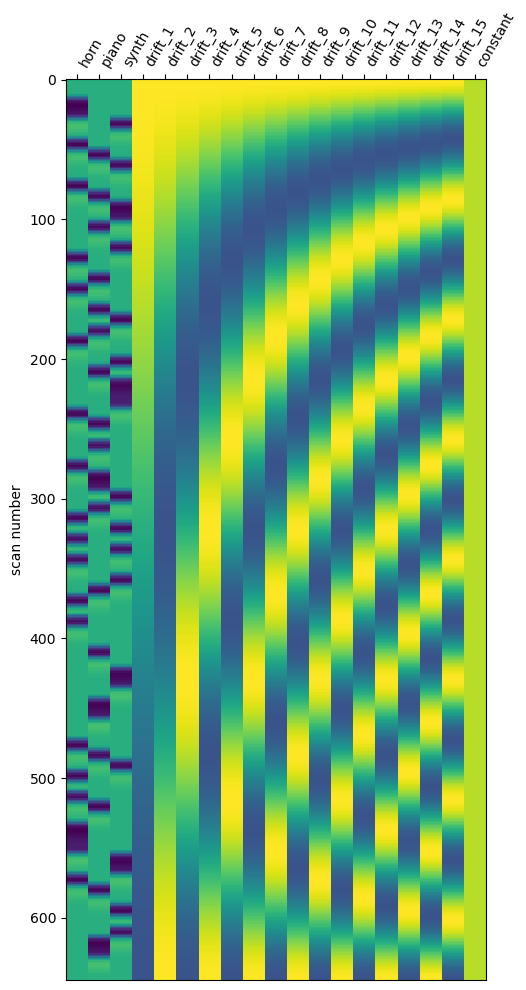

In [18]:
# Fit first level model with no HRF -- set signal_scaling to False so predictions are on same scale as observed
first_level_model = FirstLevelModel(t_r,hrf_model='SPM')

first_level_model_fit = first_level_model.fit(images, events)

# Grab the desing matrix and plot
for dmx in first_level_model_fit.design_matrices_:
    plot_design_matrix(dmx)
    
    plt.show()

<AxesSubplot: label='conditions'>

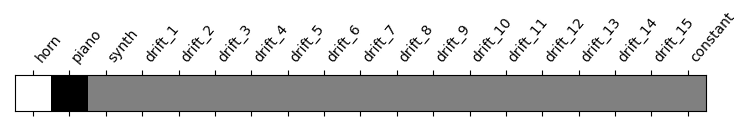

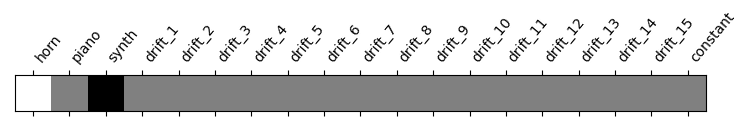

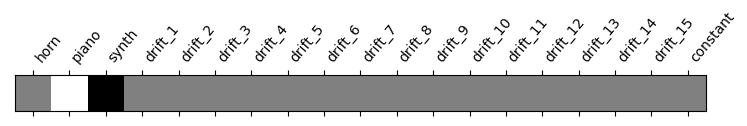

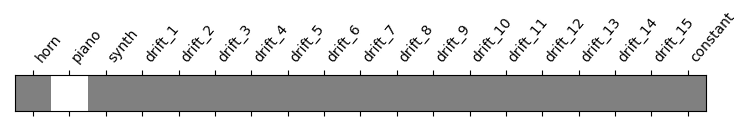

In [21]:
# specify your contrasts
# grab a design matrix to specify order of conditions in contrast
design_matrix = first_level_model_fit.design_matrices_[0]

# create a simple contrast for each column of the design matrix
contrast_matrix = np.eye(design_matrix.shape[1])
contrasts = {
    column: contrast_matrix[i]
    for i, column in enumerate(design_matrix.columns)
}

# Specify the contrasts of interest (pairwise comparisons)
contrasts = {
    "horn_vs_piano": (
        contrasts["horn"] - contrasts["piano"]
    ),
    "horn_vs_synth": (
        contrasts["horn"] - contrasts["synth"]
    ),
    "piano_vs_synth": (
        contrasts["piano"] - contrasts["synth"]),
        "piano_vs_blank": (
        contrasts["piano"]
    )
}

# Plot the contrast matrix for each comparison
plot_contrast_matrix(contrasts["horn_vs_piano"], design_matrix)
plot_contrast_matrix(contrasts["horn_vs_synth"], design_matrix)
plot_contrast_matrix(contrasts["piano_vs_synth"], design_matrix)
plot_contrast_matrix(contrasts["piano_vs_blank"], design_matrix)


In [22]:
# compute contrasts
stat_maps=[]
for index, (contrast_id, contrast_val) in enumerate(contrasts.items()):
    stat_map = first_level_model_fit.compute_contrast(
        contrast_val, stat_type = 't', output_type= 'stat',)
    stat_maps.append(stat_map)
    
#from nilearn.image import get_data

#data = get_data(stat_maps[1])
#print(f"Data range: {data.min()} to {data.max()}")

(<Figure size 426.667x480 with 5 Axes>,
 [<Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <AxesSubplot: >])

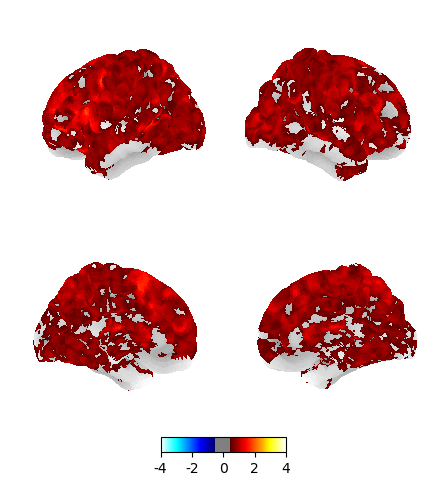

In [24]:
#plot the statistical contrast map on the surface 
#Horn vs. Piano
plotting.plot_img_on_surf(stat_map=stat_maps[0],surf_mesh='fsaverage5',threshold=.5)

In [43]:
#plot the statistical contrast map on the surface in an interactive viewer
plotting.view_img_on_surf(stat_map_img=stat_maps[0],surf_mesh='fsaverage5',threshold=1.3)

#more frontal lobe activation in LH - more concentration?
#thalamus activation in both RH/LH?

(<Figure size 426.667x480 with 5 Axes>,
 [<Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <AxesSubplot: >])

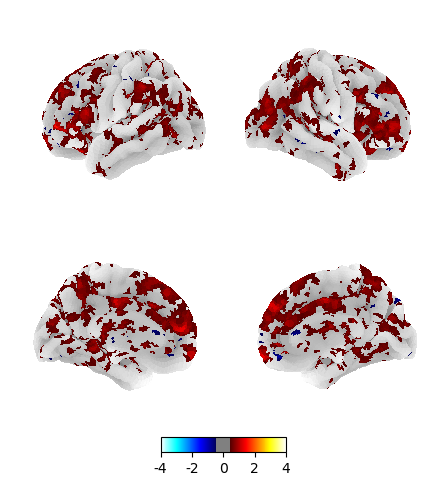

In [28]:
#plot the statistical contrast map on the surface 
#Horn vs. Synth
plotting.plot_img_on_surf(stat_map=stat_maps[1],surf_mesh='fsaverage5',threshold=.5)

In [38]:

plotting.view_img_on_surf(stat_map_img=stat_maps[1], surf_mesh='fsaverage5', threshold=1.3)
#slightly higher activation in frontal lobe / but mixed activation (some stronger, some weaker)


Data range: -4.286229194051249 to 4.713827745877152


(<Figure size 426.667x480 with 5 Axes>,
 [<Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <Axes3DSubplot: >,
  <AxesSubplot: >])

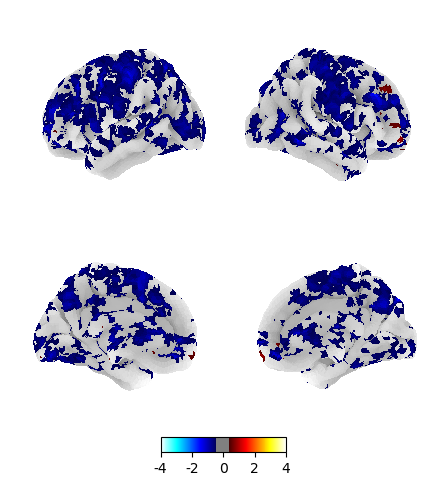

In [41]:
#plot the statistical contrast map on the surface 
#Piano vs. Synth
plotting.plot_img_on_surf(stat_map=stat_maps[2],surf_mesh='fsaverage5',threshold=.5)

In [42]:
plotting.view_img_on_surf(stat_map_img=stat_maps[2], surf_mesh='fsaverage5', threshold=1.3)
#more activation of emotinal areas of the brian RH


C:\Users\Lenovo\AppData\Roaming\Python\Python39\site-packages\nilearn\plotting\html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(


## Region of Interest Analysis

In [44]:
# grab the atlas
destrieux_atlas = datasets.fetch_atlas_surf_destrieux()


Dataset created in C:\Users\Lenovo/nilearn_data\destrieux_surface



 ...done. (2 seconds, 0 min)


 ...done. (1 seconds, 0 min)


In [46]:
print(destrieux_atlas)

{'labels': [b'Unknown', b'G_and_S_frontomargin', b'G_and_S_occipital_inf', b'G_and_S_paracentral', b'G_and_S_subcentral', b'G_and_S_transv_frontopol', b'G_and_S_cingul-Ant', b'G_and_S_cingul-Mid-Ant', b'G_and_S_cingul-Mid-Post', b'G_cingul-Post-dorsal', b'G_cingul-Post-ventral', b'G_cuneus', b'G_front_inf-Opercular', b'G_front_inf-Orbital', b'G_front_inf-Triangul', b'G_front_middle', b'G_front_sup', b'G_Ins_lg_and_S_cent_ins', b'G_insular_short', b'G_occipital_middle', b'G_occipital_sup', b'G_oc-temp_lat-fusifor', b'G_oc-temp_med-Lingual', b'G_oc-temp_med-Parahip', b'G_orbital', b'G_pariet_inf-Angular', b'G_pariet_inf-Supramar', b'G_parietal_sup', b'G_postcentral', b'G_precentral', b'G_precuneus', b'G_rectus', b'G_subcallosal', b'G_temp_sup-G_T_transv', b'G_temp_sup-Lateral', b'G_temp_sup-Plan_polar', b'G_temp_sup-Plan_tempo', b'G_temporal_inf', b'G_temporal_middle', b'Lat_Fis-ant-Horizont', b'Lat_Fis-ant-Vertical', b'Lat_Fis-post', b'Medial_wall', b'Pole_occipital', b'Pole_temporal', 

In [49]:
# Choose your OFC-related labels
ofc_labels = [b'G_orbital', b'S_orbital_lateral', b'S_orbital_med-olfact', b'S_orbital-H_Shaped']

# Load the atlas labels
labels = destrieux_atlas['labels']

# Map each label to its index
ofc_indices = [labels.index(label) for label in ofc_labels]

# Map labels to the surface
roi_map_left = destrieux_atlas['map_left']
roi_map_right = destrieux_atlas['map_right']

# Grab the indices for all OFC labels
roi_indices_left = np.where(np.isin(roi_map_left, ofc_indices))[0]
roi_indices_right = np.where(np.isin(roi_map_right, ofc_indices))[0]

print(f"Left hemisphere ROI indices: {roi_indices_left}")
print(f"Right hemisphere ROI indices: {roi_indices_right}")

from nilearn.plotting import view_surf
from nilearn.datasets import fetch_surf_fsaverage

# Load fsaverage5 surface mesh
fsaverage = fetch_surf_fsaverage()

# Create a binary ROI map (0 for non-ROI, 1 for ROI)
roi_map_left_binary = np.isin(roi_map_left, ofc_indices).astype(float)
roi_map_right_binary = np.isin(roi_map_right, ofc_indices).astype(float)

# Visualize the OFC ROI on the left hemisphere
view_surf(surf_mesh=fsaverage['infl_left'], surf_map=roi_map_left_binary, title="OFC Left Hemisphere")

# Visualize the OFC ROI on the right hemisphere
view_surf(surf_mesh=fsaverage['infl_right'], surf_map=roi_map_right_binary, title="OFC Right Hemisphere")


Left hemisphere ROI indices: [  24   25  117  118  255  256  257  267  322  323  324  427  428  514
  515  516  518  519  735  736  737  745  746  747  748  802  803  804
 1126 1127 1128 1129 1130 1131 1132 1137 1138 1139 1327 1329 1330 1331
 1611 1612 1613 1614 1615 1732 1733 1734 1735 1736 1864 1957 1958 1959
 1960 2183 2184 2185 2186 2187 2188 2189 2190 2193 2195 2196 2197 2198
 2199 2200 2430 2436 2437 2655 2656 2657 2665 2666 2667 2668 2722 2723
 2724 3047 3048 3049 3050 3051 3052 3247 3248 3249 3645 3646 3647 3648
 3649 3650 3651 3652 3678 3679 3684 3685 3686 3687 3688 3847 3848 3849
 3850 3851 3852 3853 3854 4297 4298 4299 4818 4819 4820 4821 4822 4823
 4824 4825 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837
 4844 4845 4849 4850 4851 4852 4853 4854 4855 4856 4857 4858 4859 4860
 4861 4862 5430 5431 5432 5445 5446 5447 5449 5931 5932 5933 5934 5935
 5950 5951 5952 5953 5954 5955 5956 6052 6053 6054 6055 6056 6636 6637
 6638 6639 6640 6641 6642 6643 6644 6645 6646 66

Left hemisphere ROI vertices: [  24   25  117  118  255  256  257  267  322  323  324  427  428  514
  515  516  518  519  735  736  737  745  746  747  748  802  803  804
 1126 1127 1128 1129 1130 1131 1132 1137 1138 1139 1327 1329 1330 1331
 1611 1612 1613 1614 1615 1732 1733 1734 1735 1736 1864 1957 1958 1959
 1960 2183 2184 2185 2186 2187 2188 2189 2190 2193 2195 2196 2197 2198
 2199 2200 2430 2436 2437 2655 2656 2657 2665 2666 2667 2668 2722 2723
 2724 3047 3048 3049 3050 3051 3052 3247 3248 3249 3645 3646 3647 3648
 3649 3650 3651 3652 3678 3679 3684 3685 3686 3687 3688 3847 3848 3849
 3850 3851 3852 3853 3854 4297 4298 4299 4818 4819 4820 4821 4822 4823
 4824 4825 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837
 4844 4845 4849 4850 4851 4852 4853 4854 4855 4856 4857 4858 4859 4860
 4861 4862 5430 5431 5432 5445 5446 5447 5449 5931 5932 5933 5934 5935
 5950 5951 5952 5953 5954 5955 5956 6052 6053 6054 6055 6056 6636 6637
 6638 6639 6640 6641 6642 6643 6644 6645 6646 6

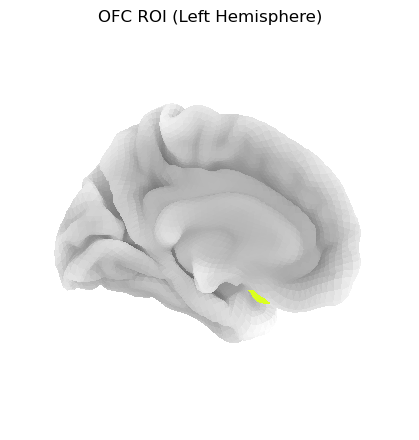

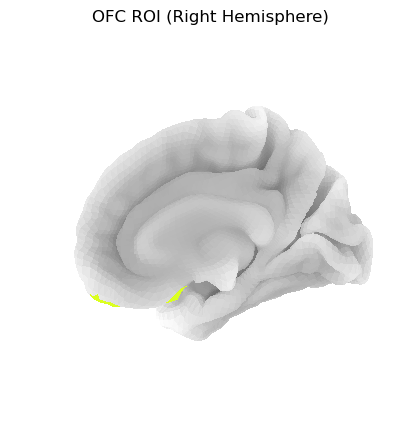

In [68]:
# Step 1: Fetch the Destrieux atlas
destrieux_atlas = fetch_atlas_surf_destrieux()

# Step 2: Define OFC-related labels
ofc_labels = [
    b'G_orbital', b'S_orbital_lateral',
    b'S_orbital_med-olfact', b'S_orbital-H_Shaped'
]

# Step 3: Map labels to indices
labels = destrieux_atlas['labels']
ofc_indices = [labels.index(label) for label in ofc_labels]

# Step 4: Load label maps and extract ROI vertices
roi_map_left = destrieux_atlas['map_left']
roi_map_right = destrieux_atlas['map_right']

# Find vertices corresponding to OFC regions
roi_vertices_left = np.where(np.isin(roi_map_left, ofc_indices))[0]
roi_vertices_right = np.where(np.isin(roi_map_right, ofc_indices))[0]

# Create binary masks
roi_mask_left = np.zeros_like(roi_map_left, dtype=int)
roi_mask_right = np.zeros_like(roi_map_right, dtype=int)
roi_mask_left[roi_vertices_left] = 1
roi_mask_right[roi_vertices_right] = 1

# Step 5: Visualize the ROI masks
fsaverage = fetch_surf_fsaverage()

# Plot the left hemisphere
plot_surf_roi(
    surf_mesh=fsaverage['pial_left'],
    roi_map=roi_mask_left,
    bg_map=fsaverage['sulc_left'],
    hemi='left', view='medial',
    title='OFC ROI (Left Hemisphere)'
)

# Plot the right hemisphere
plot_surf_roi(
    surf_mesh=fsaverage['pial_right'],
    roi_map=roi_mask_right,
    bg_map=fsaverage['sulc_right'],
    hemi='right', view='medial',
    title='OFC ROI (Right Hemisphere)'
)

# (Optional) Print confirmation
print(f"Left hemisphere ROI vertices: {roi_vertices_left}")
print(f"Right hemisphere ROI vertices: {roi_vertices_right}")


In [82]:
# Step 6: Load your stat maps (assuming you saved them as .nii.gz files)
stat_map_dir = "path_to_save_stat_maps"  # Directory where your stat maps are saved
stat_map_files = [f for f in os.listdir(stat_map_dir) if f.endswith('.nii.gz')]

# Check if stat_map_files are being read properly
print("Stat map files found:")
for stat_map_file in stat_map_files:
    print(stat_map_file)  # Print the names of the stat map files

# Step 7: Load the stat maps and check their types
for stat_map_file in stat_map_files:
    stat_map_path = os.path.join(stat_map_dir, stat_map_file)
    print(f"Loading stat map: {stat_map_path}")
    
    # Load the stat map with nibabel
    try:
        stat_map_img = nib.load(stat_map_path)
        print(f"Stat map loaded successfully: {stat_map_img}")
        
        # Check if the stat map is a 3D image
        if stat_map_img.ndim == 3:
            print("The stat map is a valid 3D image.")
        else:
            print("The stat map is not a 3D image.")
        
        # Apply the left and right OFC masks
        stat_map_left = apply_mask(stat_map_img, roi_mask_left)
        stat_map_right = apply_mask(stat_map_img, roi_mask_right)
        
        # Compute the mean activation within the OFC regions (left and right)
        mean_activation_left = np.mean(stat_map_left)
        mean_activation_right = np.mean(stat_map_right)
        
        # Print the results
        print(f"Contrast: {stat_map_file}")
        print(f"Mean activation in left OFC: {mean_activation_left:.4f}")
        print(f"Mean activation in right OFC: {mean_activation_right:.4f}")
        print("-" * 40)
    except Exception as e:
        print(f"Error loading stat map {stat_map_file}: {e}")

Stat map files found:
stat_map_0.nii.gz
stat_map_1.nii.gz
stat_map_2.nii.gz
Loading stat map: path_to_save_stat_maps\stat_map_0.nii.gz
Stat map loaded successfully: 
<class 'nibabel.nifti1.Nifti1Image'>
data shape (81, 96, 81)
affine:
[[   2.40499997    0.            0.          -96.5       ]
 [   0.            2.40499997    0.         -132.5       ]
 [   0.            0.            2.4000001   -78.5       ]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b''
dim_info        : 0
dim             : [ 3 81 96 81  1  1  1  1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float64
bitpix          : 64
slice_start     : 0
pixdim          : [1.    2.405 2.405 2.4   1.    1.    1.    1.   ]
vox_offset      : 0.0
scl_slope       : nan
s

In [86]:

# Load the NIfTI file
img = nib.load('path_to_save_stat_maps/stat_map_0.nii.gz')

# Get the data and inspect its dtype using get_fdata()
data = img.get_fdata()
print(data.dtype)


float64


Left hemisphere ROI vertices: [  24   25  117  118  255  256  257  267  322  323  324  427  428  514
  515  516  518  519  735  736  737  745  746  747  748  802  803  804
 1126 1127 1128 1129 1130 1131 1132 1137 1138 1139 1327 1329 1330 1331
 1611 1612 1613 1614 1615 1732 1733 1734 1735 1736 1864 1957 1958 1959
 1960 2183 2184 2185 2186 2187 2188 2189 2190 2193 2195 2196 2197 2198
 2199 2200 2430 2436 2437 2655 2656 2657 2665 2666 2667 2668 2722 2723
 2724 3047 3048 3049 3050 3051 3052 3247 3248 3249 3645 3646 3647 3648
 3649 3650 3651 3652 3678 3679 3684 3685 3686 3687 3688 3847 3848 3849
 3850 3851 3852 3853 3854 4297 4298 4299 4818 4819 4820 4821 4822 4823
 4824 4825 4826 4827 4828 4829 4830 4831 4832 4833 4834 4835 4836 4837
 4844 4845 4849 4850 4851 4852 4853 4854 4855 4856 4857 4858 4859 4860
 4861 4862 5430 5431 5432 5445 5446 5447 5449 5931 5932 5933 5934 5935
 5950 5951 5952 5953 5954 5955 5956 6052 6053 6054 6055 6056 6636 6637
 6638 6639 6640 6641 6642 6643 6644 6645 6646 6

IndexError: boolean index did not match indexed array along dimension 0; dimension is 81 but corresponding boolean dimension is 10242

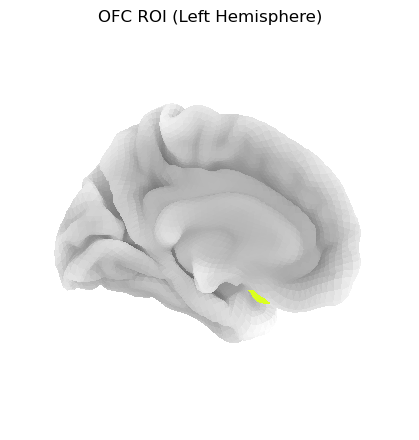

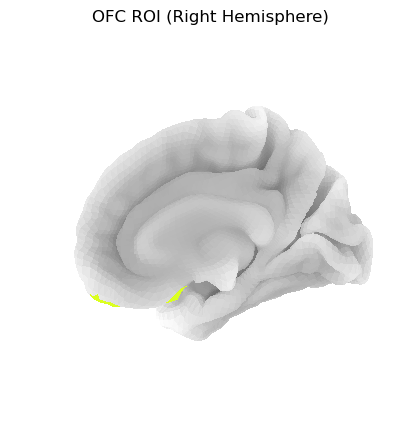

In [87]:


# Step 1: Fetch the Destrieux atlas
destrieux_atlas = fetch_atlas_surf_destrieux()

# Step 2: Define OFC-related labels
ofc_labels = [
    b'G_orbital', b'S_orbital_lateral',
    b'S_orbital_med-olfact', b'S_orbital-H_Shaped'
]

# Step 3: Map labels to indices
labels = destrieux_atlas['labels']
ofc_indices = [labels.index(label) for label in ofc_labels]

# Step 4: Load label maps and extract ROI vertices
roi_map_left = destrieux_atlas['map_left']
roi_map_right = destrieux_atlas['map_right']

# Find vertices corresponding to OFC regions
roi_vertices_left = np.where(np.isin(roi_map_left, ofc_indices))[0]
roi_vertices_right = np.where(np.isin(roi_map_right, ofc_indices))[0]

# Create binary masks
roi_mask_left = np.zeros_like(roi_map_left, dtype=int)
roi_mask_right = np.zeros_like(roi_map_right, dtype=int)
roi_mask_left[roi_vertices_left] = 1
roi_mask_right[roi_vertices_right] = 1

# Step 5: Visualize the ROI masks
fsaverage = fetch_surf_fsaverage()

# Plot the left hemisphere
plot_surf_roi(
    surf_mesh=fsaverage['pial_left'],
    roi_map=roi_mask_left,
    bg_map=fsaverage['sulc_left'],
    hemi='left', view='medial',
    title='OFC ROI (Left Hemisphere)'
)

# Plot the right hemisphere
plot_surf_roi(
    surf_mesh=fsaverage['pial_right'],
    roi_map=roi_mask_right,
    bg_map=fsaverage['sulc_right'],
    hemi='right', view='medial',
    title='OFC ROI (Right Hemisphere)'
)

# (Optional) Print confirmation
print(f"Left hemisphere ROI vertices: {roi_vertices_left}")
print(f"Right hemisphere ROI vertices: {roi_vertices_right}")

# Step 6: Load your stat maps (assuming you saved them as .nii.gz files)
stat_map_dir = "path_to_save_stat_maps"  # Directory where your stat maps are saved
stat_map_files = [f for f in os.listdir(stat_map_dir) if f.endswith('.nii.gz')]

# Define a function to apply mask to the stat map
def apply_mask(stat_map_img, roi_mask):
    # Get the stat map data as a numpy array
    stat_map_data = stat_map_img.get_fdata()  # This returns a float64 array
    # Apply the mask to the stat map (binary mask)
    masked_stat_map = stat_map_data[roi_mask == 1]
    return masked_stat_map

# Step 7: Apply the OFC mask and extract relevant data
for stat_map_file in stat_map_files:
    # Load the stat map
    stat_map_path = os.path.join(stat_map_dir, stat_map_file)
    stat_map_img = nib.load(stat_map_path)
    
    # Apply the left and right OFC masks
    stat_map_left = apply_mask(stat_map_img, roi_mask_left)
    stat_map_right = apply_mask(stat_map_img, roi_mask_right)
    
    # Compute the mean activation within the OFC regions (left and right)
    mean_activation_left = np.mean(stat_map_left)
    mean_activation_right = np.mean(stat_map_right)
    
    # Print the results
    print(f"Contrast: {stat_map_file}")
    print(f"Mean activation in left OFC: {mean_activation_left:.4f}")
    print(f"Mean activation in right OFC: {mean_activation_right:.4f}")
    print("-" * 40)


In [88]:
# Inspect the shapes of the data
print("Stat map data shape:", stat_map_img.shape)
print("Left ROI mask shape:", roi_mask_left.shape)
print("Right ROI mask shape:", roi_mask_right.shape)


Stat map data shape: (81, 96, 81)
Left ROI mask shape: (10242,)
Right ROI mask shape: (10242,)


In [78]:
# Directory to save the statistical maps
output_dir = 'path_to_save_stat_maps'  

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Loop through the list of stat_maps and save each one
for idx, stat_map in enumerate(stat_maps):
    # Generate the filename for each stat map
    stat_map_filename = os.path.join(output_dir, f"stat_map_{idx}.nii.gz")
    
    # Save the stat map as a .nii.gz file
    stat_map.to_filename(stat_map_filename)
    
    # Print the file path for confirmation
    print(f"Saved stat map: {stat_map_filename}")


Saved stat map: path_to_save_stat_maps\stat_map_0.nii.gz
Saved stat map: path_to_save_stat_maps\stat_map_1.nii.gz
Saved stat map: path_to_save_stat_maps\stat_map_2.nii.gz


In [93]:

# Fetch AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Check the keys in the aal_atlas object
print(aal_atlas.keys())

# Get the labels (list of regions)
aal_labels = aal_atlas['labels']
print(aal_labels)


dict_keys(['description', 'maps', 'labels', 'indices'])
['Precentral_L', 'Precentral_R', 'Frontal_Sup_L', 'Frontal_Sup_R', 'Frontal_Sup_Orb_L', 'Frontal_Sup_Orb_R', 'Frontal_Mid_L', 'Frontal_Mid_R', 'Frontal_Mid_Orb_L', 'Frontal_Mid_Orb_R', 'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 'Frontal_Inf_Orb_L', 'Frontal_Inf_Orb_R', 'Rolandic_Oper_L', 'Rolandic_Oper_R', 'Supp_Motor_Area_L', 'Supp_Motor_Area_R', 'Olfactory_L', 'Olfactory_R', 'Frontal_Sup_Medial_L', 'Frontal_Sup_Medial_R', 'Frontal_Med_Orb_L', 'Frontal_Med_Orb_R', 'Rectus_L', 'Rectus_R', 'Insula_L', 'Insula_R', 'Cingulum_Ant_L', 'Cingulum_Ant_R', 'Cingulum_Mid_L', 'Cingulum_Mid_R', 'Cingulum_Post_L', 'Cingulum_Post_R', 'Hippocampus_L', 'Hippocampus_R', 'ParaHippocampal_L', 'ParaHippocampal_R', 'Amygdala_L', 'Amygdala_R', 'Calcarine_L', 'Calcarine_R', 'Cuneus_L', 'Cuneus_R', 'Lingual_L', 'Lingual_R', 'Occipital_Sup_L', 'Occipital_Sup_R', 'Occipital_Mid_L', 'Occipital_Mid_R', 'Occipital_In

In [106]:
# Load the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Define the labels for the OFC regions
ofc_labels = ['Frontal_Sup_Orb_L', 'Frontal_Sup_Orb_R', 'Frontal_Mid_Orb_L', 'Frontal_Mid_Orb_R']

# Get the indices corresponding to the OFC labels
aal_labels = aal_atlas['labels']
aal_indices = aal_atlas['indices']

# Map labels to indices for OFC regions
ofc_indices = [aal_indices[aal_labels.index(label)] for label in ofc_labels]
print("OFC Indices:", ofc_indices)  # Debugging step

#stat map files
stat_map_dir = "path_to_save_stat_maps"  
stat_map_files = ['stat_map_0.nii.gz', 'stat_map_1.nii.gz', 'stat_map_2.nii.gz']

# Function to apply the OFC mask
def apply_oofc_mask(stat_map_img, ofc_indices, aal_atlas):
    # Load the AAL map data
    aal_map_path = aal_atlas['maps']
    aal_map_img = nib.load(aal_map_path)
    
    # Resample the AAL map to match the stat map's dimensions and affine
    aal_map_resampled = image.resample_to_img(aal_map_img, stat_map_img, interpolation='nearest')
    
    # Get the AAL map data
    aal_data = aal_map_resampled.get_fdata()
    
    # Debugging step: Check unique values in AAL map
    print("Unique values in AAL map:", np.unique(aal_data))  
    
    # Create a mask based on the indices of the OFC regions
    # Check if the AAL data contains the correct values
    ofc_mask = np.zeros(aal_data.shape, dtype=int)
    for idx in ofc_indices:
        ofc_mask[aal_data == idx] = 1  # Apply the mask where the index matches
    
    # Get the stat map data
    stat_map_data = stat_map_img.get_fdata()
    
    # Debugging step: Ensure mask and stat map have the same shape
    print("Shape of stat map:", stat_map_data.shape)
    print("Shape of OFC mask:", ofc_mask.shape)
    
    # Apply the mask (3D mask to 3D stat map)
    masked_stat_map = stat_map_data[ofc_mask == 1]
    
    return masked_stat_map

# Loop through the stat map files
for stat_map_file in stat_map_files:
    # Load the stat map
    stat_map_path = os.path.join(stat_map_dir, stat_map_file)
    stat_map_img = nib.load(stat_map_path)
    
    # Apply the OFC mask
    masked_stat_map = apply_oofc_mask(stat_map_img, ofc_indices, aal_atlas)
    
    # Compute the mean activation within the OFC regions
    if masked_stat_map.size > 0:
        mean_activation = np.mean(masked_stat_map)
        print(f"Contrast: {stat_map_file}")
        print(f"Mean activation in OFC: {mean_activation:.4f}")
    else:
        print(f"Contrast: {stat_map_file}")
        print(f"No data found in the OFC regions.")
    
    print("-" * 40)


OFC Indices: ['2111', '2112', '2211', '2212']
Unique values in AAL map: [   0. 2001. 2002. 2101. 2102. 2111. 2112. 2201. 2202. 2211. 2212. 2301.
 2302. 2311. 2312. 2321. 2322. 2331. 2332. 2401. 2402. 2501. 2502. 2601.
 2602. 2611. 2612. 2701. 2702. 3001. 3002. 4001. 4002. 4011. 4012. 4021.
 4022. 4101. 4102. 4111. 4112. 4201. 4202. 5001. 5002. 5011. 5012. 5021.
 5022. 5101. 5102. 5201. 5202. 5301. 5302. 5401. 5402. 6001. 6002. 6101.
 6102. 6201. 6202. 6211. 6212. 6221. 6222. 6301. 6302. 6401. 6402. 7001.
 7002. 7011. 7012. 7021. 7022. 7101. 7102. 8101. 8102. 8111. 8112. 8121.
 8122. 8201. 8202. 8211. 8212. 8301. 8302. 9001. 9002. 9011. 9012. 9021.
 9022. 9031. 9032. 9041. 9042. 9051. 9052. 9061. 9062. 9071. 9072. 9081.
 9082. 9100. 9110. 9120. 9130. 9140. 9150. 9160. 9170.]
Shape of stat map: (81, 96, 81)
Shape of OFC mask: (81, 96, 81)
Contrast: stat_map_0.nii.gz
No data found in the OFC regions.
----------------------------------------
Unique values in AAL map: [   0. 2001. 2002. 210

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1482897245.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ofc_mask[aal_data == idx] = 1  # Apply the mask where the index matches
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1482897245.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ofc_mask[aal_data == idx] = 1  # Apply the mask where the index matches
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1482897245.py:42: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ofc_mask[aal_data == idx] = 1  # Apply the mask where the index matches


In [108]:

# Define the labels for the frontal regions
frontal_labels = ['Frontal_Sup_L', 'Frontal_Sup_R', 
    'Frontal_Sup_Orb_L', 'Frontal_Sup_Orb_R', 
    'Frontal_Mid_L', 'Frontal_Mid_R', 
    'Frontal_Mid_Orb_L', 'Frontal_Mid_Orb_R', 
    'Frontal_Inf_Oper_L', 'Frontal_Inf_Oper_R', 
    'Frontal_Inf_Tri_L', 'Frontal_Inf_Tri_R', 
    'Frontal_Inf_Orb_L', 'Frontal_Inf_Orb_R']



OFC Indices: ['2101', '2102', '2111', '2112', '2201', '2202', '2211', '2212', '2301', '2302', '2311', '2312', '2321', '2322']
Unique values in AAL map: [   0. 2001. 2002. 2101. 2102. 2111. 2112. 2201. 2202. 2211. 2212. 2301.
 2302. 2311. 2312. 2321. 2322. 2331. 2332. 2401. 2402. 2501. 2502. 2601.
 2602. 2611. 2612. 2701. 2702. 3001. 3002. 4001. 4002. 4011. 4012. 4021.
 4022. 4101. 4102. 4111. 4112. 4201. 4202. 5001. 5002. 5011. 5012. 5021.
 5022. 5101. 5102. 5201. 5202. 5301. 5302. 5401. 5402. 6001. 6002. 6101.
 6102. 6201. 6202. 6211. 6212. 6221. 6222. 6301. 6302. 6401. 6402. 7001.
 7002. 7011. 7012. 7021. 7022. 7101. 7102. 8101. 8102. 8111. 8112. 8121.
 8122. 8201. 8202. 8211. 8212. 8301. 8302. 9001. 9002. 9011. 9012. 9021.
 9022. 9031. 9032. 9041. 9042. 9051. 9052. 9061. 9062. 9071. 9072. 9081.
 9082. 9100. 9110. 9120. 9130. 9140. 9150. 9160. 9170.]


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\211654118.py:51: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if idx in np.unique(aal_data):  # Check if index is in the AAL data


Shape of stat map: (81, 96, 81)
Shape of OFC mask: (81, 96, 81)
Contrast: stat_map_0.nii.gz
No data found in the OFC regions.
----------------------------------------
Unique values in AAL map: [   0. 2001. 2002. 2101. 2102. 2111. 2112. 2201. 2202. 2211. 2212. 2301.
 2302. 2311. 2312. 2321. 2322. 2331. 2332. 2401. 2402. 2501. 2502. 2601.
 2602. 2611. 2612. 2701. 2702. 3001. 3002. 4001. 4002. 4011. 4012. 4021.
 4022. 4101. 4102. 4111. 4112. 4201. 4202. 5001. 5002. 5011. 5012. 5021.
 5022. 5101. 5102. 5201. 5202. 5301. 5302. 5401. 5402. 6001. 6002. 6101.
 6102. 6201. 6202. 6211. 6212. 6221. 6222. 6301. 6302. 6401. 6402. 7001.
 7002. 7011. 7012. 7021. 7022. 7101. 7102. 8101. 8102. 8111. 8112. 8121.
 8122. 8201. 8202. 8211. 8212. 8301. 8302. 9001. 9002. 9011. 9012. 9021.
 9022. 9031. 9032. 9041. 9042. 9051. 9052. 9061. 9062. 9071. 9072. 9081.
 9082. 9100. 9110. 9120. 9130. 9140. 9150. 9160. 9170.]


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\211654118.py:51: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if idx in np.unique(aal_data):  # Check if index is in the AAL data


Shape of stat map: (81, 96, 81)
Shape of OFC mask: (81, 96, 81)
Contrast: stat_map_1.nii.gz
No data found in the OFC regions.
----------------------------------------
Unique values in AAL map: [   0. 2001. 2002. 2101. 2102. 2111. 2112. 2201. 2202. 2211. 2212. 2301.
 2302. 2311. 2312. 2321. 2322. 2331. 2332. 2401. 2402. 2501. 2502. 2601.
 2602. 2611. 2612. 2701. 2702. 3001. 3002. 4001. 4002. 4011. 4012. 4021.
 4022. 4101. 4102. 4111. 4112. 4201. 4202. 5001. 5002. 5011. 5012. 5021.
 5022. 5101. 5102. 5201. 5202. 5301. 5302. 5401. 5402. 6001. 6002. 6101.
 6102. 6201. 6202. 6211. 6212. 6221. 6222. 6301. 6302. 6401. 6402. 7001.
 7002. 7011. 7012. 7021. 7022. 7101. 7102. 8101. 8102. 8111. 8112. 8121.
 8122. 8201. 8202. 8211. 8212. 8301. 8302. 9001. 9002. 9011. 9012. 9021.
 9022. 9031. 9032. 9041. 9042. 9051. 9052. 9061. 9062. 9071. 9072. 9081.
 9082. 9100. 9110. 9120. 9130. 9140. 9150. 9160. 9170.]


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\211654118.py:51: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if idx in np.unique(aal_data):  # Check if index is in the AAL data


Shape of stat map: (81, 96, 81)
Shape of OFC mask: (81, 96, 81)
Contrast: stat_map_2.nii.gz
No data found in the OFC regions.
----------------------------------------


## Decoding analysis


In [115]:
func_ds = image.concat_imgs(images)  # Combine the images into a single 4D image object

# Print the shape of the combined fMRI data
print("fMRI data shape:", func_ds.shape)

fMRI data shape: (81, 96, 81, 645)


In [119]:
av_cols = design_matrix[['horn', 'synth', 'piano']] != 0

# Generate a mask based on whether any of the conditions (horn, synth, piano) were presented
condition_mask = np.array((av_cols['horn'] == True) | (av_cols['synth'] == True) | (av_cols['piano'] == True))

conditions = [
    'horn' if av_cols.iloc[i]['horn'] == 1 else
    'synth' if av_cols.iloc[i]['synth'] == 1 else
    'piano' if av_cols.iloc[i]['piano'] == 1 else 'other'
    for i in range(len(av_cols))
]
conditions = np.array(conditions)

# Print out lengths to verify consistency
print("Conditions length:", len(conditions))
print("Condition Mask length:", len(condition_mask))
print("fMRI data shape:", func_ds.shape)


# Mask the functional data using the condition mask
func_ds_masked = image.index_img(func_ds, condition_mask)

# Mask the conditions list using the same condition mask
conditions_masked = conditions[condition_mask]

# Check if the dimensions match after masking
print("Masked fMRI data shape:", func_ds_masked.shape)
print("Masked conditions length:", len(conditions_masked))


Conditions length: 645
Condition Mask length: 645
fMRI data shape: (81, 96, 81, 645)
Masked fMRI data shape: (81, 96, 81, 636)
Masked conditions length: 636


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1842088131.py:55: UserWarning: The given float value must not exceed 4.28092190797339. But, you have given threshold=20.
  cluster_img = image.threshold_img(thresholded_stat_map, cluster_size_threshold)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1842088131.py:55: UserWarning: The given float value must not exceed 4.713827745877152. But, you have given threshold=20.
  cluster_img = image.threshold_img(thresholded_stat_map, cluster_size_threshold)
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_4460\1842088131.py:55: UserWarning: The given float value must not exceed 4.823322658012195. But, you have given threshold=20.
  cluster_img = image.threshold_img(thresholded_stat_map, cluster_size_threshold)


TypeError: 'Nifti1Image' object is not callable

In [ ]:
#Generate the cluster mask using z-scoring
z_threshold = 2.0  # Z-score threshold for significance 
cluster_size_threshold = 10  # Minimum cluster size in number of voxels

# Create a list to store the cluster images
cluster_images = []

# Loop through the computed statistical maps and apply z-scoring
for stat_map in stat_maps:
    # Z-score the statistical map to standardize the values
    stat_map_data = stat_map.get_fdata()
    z_scored_data = (stat_map_data - np.mean(stat_map_data)) / np.std(stat_map_data)

    # Threshold based on z-score (keeping values greater than the threshold)
    thresholded_data = np.where(z_scored_data > z_threshold, z_scored_data, 0)

    # Apply the cluster size threshold (keep only clusters with a size above the threshold)
    cluster_img_data = np.where(thresholded_data > 0, 1, 0)  # Binarize the thresholded data
    cluster_img = image.new_img_like(stat_map, cluster_img_data)
    
    # Check if the cluster_img is empty
    #if cluster_img.get_fdata().sum() == 0:
        #print("Warning: Cluster mask is empty after thresholding")
    #else:
        #cluster_images.append(cluster_img)

# If no valid clusters were found, this would stop further steps
#if not cluster_images:
    #raise ValueError("No valid clusters were found after thresholding.")

# try first cluster img
cluster_img = cluster_images[0]  # Select the first cluster image

# load cluster mask
masker = NiftiMasker(mask_img=cluster_img)

# svc decoding
decoder = Decoder(
    estimator='svc', 
    mask=masker,
    standardize="zscore_sample",  # Standardize the data before fitting
    cv=3,
    scoring='accuracy'
)


decoder.fit(func_ds_masked, conditions_masked)


prediction = decoder.predict(func_ds_masked)


print("Predictions:", prediction)
print("Observed conditions:", conditions_masked)


accuracy = (prediction == conditions_masked).sum() / float(len(conditions_masked))
print(f"Prediction accuracy: {accuracy:.2f}")


plotting.view_img(
    decoder.coef_img_["horn"], title="Coefficient Map for Horn Condition"
)
